In [652]:
using Plots
using LinearAlgebra
using LaTeXStrings
using StatsBase
using CSV
using DataFrames

In [653]:
t_start = time();

## Parameters:

In [654]:
### todo ky=0
### mu = 0, rational done
### mu = 1.2, rational done
### mu = 0, irrational ongoing
### mu = 1.2, irrational todo

In [655]:
mu=1.2;
t = 1;
t0 = 1;
m_0 = -0.2;
Delta = 0.5;

x_periodic = 0;
y_periodic = 0;

L = 84;

ky = 0;
Lx = L;
Ly = L;

exportdata=1;

In [656]:

sigma_x = [0 1;
           1 0];
sigma_y = [0 -im;
           im 0];
sigma_z = [1 0;
           0 -1];
eye2 = [1 0;
        0 1];
gamma_01 = kron(eye2, sigma_x);
gamma_02 = kron(eye2, sigma_y);
gamma_03 = kron(eye2, sigma_z);
gamma_13 = kron(sigma_x,sigma_z);
gamma_30 = kron(sigma_z, eye2);
# gamma_31 = kron(sigma_z, sigma_x);
# gamma_32 = kron(sigma_z, sigma_y);
# gamma_33 = kron(sigma_z, sigma_z);
gamma_12 = kron(sigma_x, sigma_y);
gamma_23 = kron(sigma_y, sigma_z)

4×4 Matrix{Complex{Int64}}:
 0+0im  0+0im  0-1im  0+0im
 0+0im  0+0im  0+0im  0+1im
 0+1im  0+0im  0+0im  0+0im
 0+0im  0-1im  0+0im  0+0im

Equation of two lines are $y = mx + c_1$ and $y = mx + c_2$

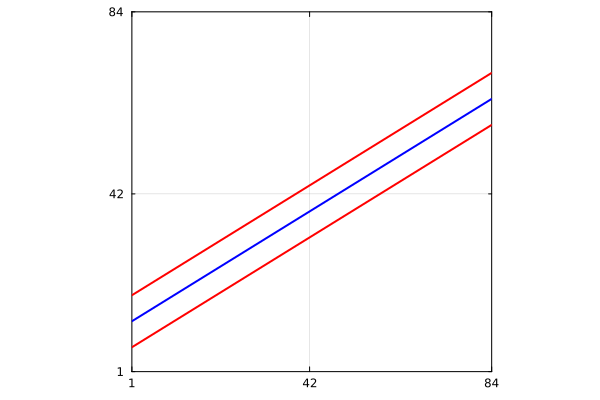

In [657]:
m = (-1+sqrt(5))/2;
# m=2/3
c1 = 6
c2 = 18

function line_down(x::Float64)
    return c1 + m*x
end

function line_up(x::Float64)
    return c2 + m*x
end

function line_middle(x::Float64)
    return (line_up(x) + line_down(x))/2
end

line_x = [1.0,L]
line_down_y = line_down.(line_x)
line_up_y = line_up.(line_x)

plot(line_x,line_down_y,color="red",width=2, xlims=(1,Lx),ylims=(1,Ly),legend=:none,aspect_ratio=:equal,frame=:box, framestyle=:thick,xticks=[1,Lx/2,Lx],yticks=[1,Ly/2,Ly])
plot!(line_x,line_up_y,color="red",width=2)
plot!(line_x,line_middle.(line_x),color="blue",width=2)

In [658]:
points_x_array = range(1, L,L)
points_y_array = range(1, L,L)

points2 = zeros(2*L^2)
for ii = 1:L
    for jj = 1:L
        points2[2*((jj-1)*L+ii)-1] = points_x_array[ii]
        points2[2*((jj-1)*L+ii)] = points_y_array[jj]
    end
end


### These arrays have N^2 elements, and hold the x and y coordinates of nth site
points_x_array = points2[1:2:end]
points_y_array =  points2[2:2:end]

site_index = range(1,L^2, L^2)

1.0:1.0:7056.0

### Now we isolate the PTB points

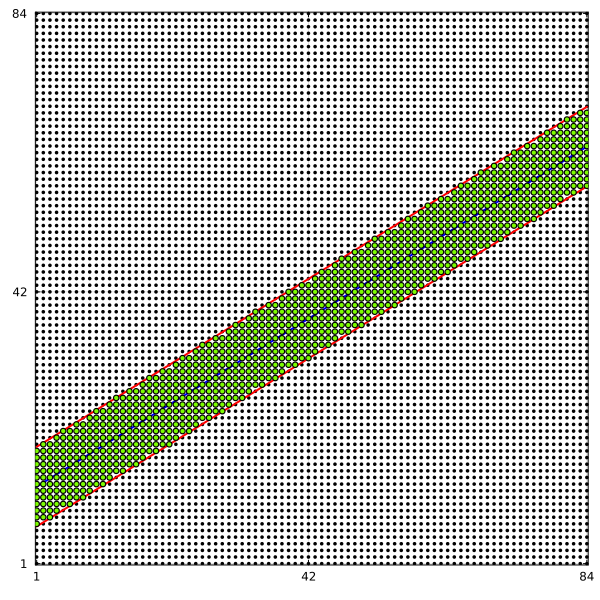

In [659]:
### PTB_index will contain ordered indices of the sites in PTB

PTB_index_dummy = collect(range(1,L^2,L^2))
for ii = 1:L^2
    if (points_y_array[ii] >= line_down(points_x_array[ii])) && (points_y_array[ii] <= line_up(points_x_array[ii]))
        ## Do nothing
    else
        PTB_index_dummy[ii] = 0.0
    end
end

## Here we store non-zero indices
PTB_index = findall(!iszero, PTB_index_dummy)

N_PTB = size(PTB_index)[1]

points_PTB_array_x = zeros(N_PTB)
points_PTB_array_y = zeros(N_PTB)

for ii = 1:N_PTB
    points_PTB_array_x[ii] = points_x_array[PTB_index[ii]]
    points_PTB_array_y[ii] = points_y_array[PTB_index[ii]]
end

### Draw lines separating PTB
line_x = [1.0,L]
line_down_y = line_down.(line_x)
line_up_y = line_up.(line_x)

plt_lattice=scatter(points_x_array, points_y_array,aspect_ratio=1,legend=false, 
                    xlims=[0.8,L+0.2], ylims=[0.8,L+0.2],color="black",markersize=2, frame=:box, framestyle=:thick, xticks=[1,Lx/2,Lx],yticks=[1,Ly/2,Ly], size=(600,600))
plt_lattice=plot!(line_x,line_down_y,color="red",width=2)
plt_lattice=plot!(line_x,line_up_y,color="red",width=2)
plt_lattice=plot!(line_x,line_middle.(line_x),color="blue",width=2)
plt_lattice=scatter!(points_PTB_array_x, points_PTB_array_y,color="lawngreen",aspect_ratio=1,legend=false,markersize=3)

## Percentage of sites in PTB

In [660]:
println("Number of sites in PTB = ",N_PTB)
println("Amount of sites in PTB = ",100* N_PTB/L^2, " %")

In [661]:
100* N_PTB/L^2

14.285714285714286

In [662]:
println(PTB_index)

## Coordinates of projected sites

### Equation of line_down is $y=mx + c_1$
### Equation of projector line is, $y-y_1 = (-1/m).(x-x_1)$, where $(x_1,y_1)$ is the coordinate of the site
### The two lines intersect at $((m.y_1 + x_1 - m.c_1)/(m^2 + 1), (m^2.y_1 + m.x_1 + c_1)/(m^2 + 1))$

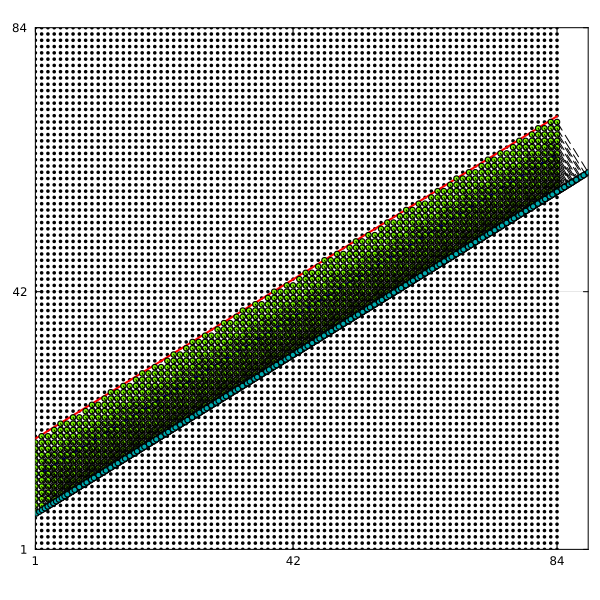

In [663]:
projected_points_PTB_array_x = (m*points_PTB_array_y + points_PTB_array_x - m*ones(N_PTB)*c1)/(m^2 + 1);
projected_points_PTB_array_y = m*projected_points_PTB_array_x + c1 * ones(N_PTB);

## This array contains distance along the line
## This should be x coordinates on the line * sec(theta), where the slope is tan(theta) = m
distance_along_projected_line = projected_points_PTB_array_x * sqrt(m^2 +1)

for ii = 1:N_PTB
    line_projected_x = [points_PTB_array_x[ii],projected_points_PTB_array_x[ii]]
    line_projected_y = [points_PTB_array_y[ii],projected_points_PTB_array_y[ii]]
    plt_lattice=plot!(line_projected_x,line_projected_y,linestyle=:dash, color="black")
end
plt_lattice=scatter!(projected_points_PTB_array_x,projected_points_PTB_array_y, 
            xlims=(1,maximum(vcat(projected_points_PTB_array_x,Lx))), ylims=(1,maximum(vcat(projected_points_PTB_array_y,Ly))), markersize=3)
display(plt_lattice)

## Generate Parent Hamiltonian

In [664]:
include("generate_matrices2D.jl")
include("angmom.jl")

generate_spin_matrices (generic function with 1 method)

In [665]:
println("t = ",t)
println("t0 = ", t0)
println("m_0 = ", m_0)
println("Delta = ", Delta)


println("Lx = ", Lx)
println("Ly = ", Ly)

In [666]:
if(x_periodic^2 != x_periodic || y_periodic^2 != y_periodic)
    println("x_periodic and y_periodic must be 0 or 1")
    println("You entered x_periodic = ", x_periodic, " y_periodic = ", y_periodic)
    return
end

In [667]:

const_2D, CX2D, SX2D, CY2D, SY2D, CXCY2D, SXCY2D, CXSY2D = generate_matrices_2D(Lx,Ly,x_periodic,y_periodic)

h_SSH = t*kron(SX2D,gamma_01) + 0*kron(SY2D,gamma_02) + kron(m_0*const_2D- t0*(CX2D + cos(ky)*const_2D),gamma_03) + Delta*kron(const_2D,gamma_13) -mu*kron(const_2D,gamma_30)

if(Hermitian_Check(h_SSH) == false)
    println("Error! Hamiltonian is not Hermitian")
    return
end

### The following (commented out to save execution time) is the code for local Chern marker in the parent lattice

In [668]:
# XList_parent = kron(range(1,1,Ly),range(1,Lx,Lx))
# YList_parent = kron(range(1,Ly,Ly),range(1,1,Lx))


# X1_parent = kron(diagm(XList_parent),kron(eye2,eye2))
# Y1_parent = kron(diagm(YList_parent),kron(eye2,eye2))

# energy_eigenvalues_parent, eigenstates_parent = eigen(h_SSH);
# filled_eigenstates_parent = eigenstates_parent[:,1:2*Lx*Ly]

# # ## We create a projector P, which projects to the space of filled eigenstates (half-filled)
# P_parent = conj(filled_eigenstates_parent) * transpose(filled_eigenstates_parent)
# # ## Q projects to the empty eigenstates
# Q_parent = kron(const_2D,kron(eye2,eye2)) - P_parent

# W_parent = kron(const_2D,gamma_12);

# # ## We define the local Chern operators, whose diagonal elements in the Wannier basis are the local Chern numbers per orbital
# PolMatrix_parent = W_parent*(Q_parent*X1_parent*P_parent + P_parent*X1_parent*Q_parent);

# PolMatrixSiteWiseList_parent = zeros(Lx*Ly)*im;

# # ## Here we add the two chern numbers for the two orbitals
# for ii = 1:Lx*Ly
#     PolMatrixSiteWiseList_parent[ii] = PolMatrix_parent[4*(ii-1) + 1,4*(ii-1) + 1] + PolMatrix_parent[4*(ii-1) + 2,4*(ii-1) + 2] + PolMatrix_parent[4*(ii-1) + 3,4*(ii-1) + 3] + PolMatrix_parent[4*(ii-1) + 4,4*(ii-1) + 4]
# end

# PolMatrixSiteWiseList_parent = real(PolMatrixSiteWiseList_parent)
# println(PolMatrixSiteWiseList_parent)

In [669]:
# plt1 = scatter(1:Lx*Ly, PolMatrixSiteWiseList_parent,ylims=(-2,2))
# display(plt1)

### I plot the local topological marker at the middle line $y = L_y/2$ of the lattice

In [670]:
# ### We will plot the local Chern marker along the line y = Ly/2
# plt_Chern_parent = scatter(1:Lx, PolMatrixSiteWiseList_parent[(Int(round(Ly/2)) - 1)*Lx+1:(Int(round(Ly/2)) - 1)*Lx+Lx], ylims=(-3,3), 
#                 xlabel="x", ylabel="Perent lattice Local Chern marker at y=L/2", legend=:none,
#                 title=string("Lx = ", string(Lx), ", t = ", string(t), ", t0 = ", string(t0), ", m_0 = ", string(m_0), ", Delta = ", string(Delta)))
# display(plt_Chern_parent)

## Clear variables

In [671]:
const_2D= Nothing
CX2D= Nothing
SX2D= Nothing
CY2D= Nothing
SY2D= Nothing
CXCY2D= Nothing
SXCY2D= Nothing
CXSY2D= Nothing

Nothing

## Now generate PTB Hamiltonian

In [672]:
PTB_orbital_index = ones(4*N_PTB);
for ii = 1:N_PTB
    PTB_orbital_index[4*ii-3] = 4*PTB_index[ii]-3
    PTB_orbital_index[4*ii-2] = 4*PTB_index[ii]-2
    PTB_orbital_index[4*ii-1] = 4*PTB_index[ii]-1
    PTB_orbital_index[4*ii] = 4*PTB_index[ii]
end
println(PTB_orbital_index)

In [673]:
outside_orbital_index = setdiff(1:4*Lx*Ly,PTB_orbital_index);
println(outside_orbital_index)

In [674]:
NOrbitalsOutside = 4*Lx*Ly - 4*N_PTB

24192

In [675]:
NOrbitalsInside = 4*N_PTB

4032

In [676]:
H_PTB_renor = zeros(ComplexF64, NOrbitalsInside, NOrbitalsInside);

H_11 = zeros(ComplexF64, NOrbitalsInside, NOrbitalsInside);

H_22 = zeros(ComplexF64, NOrbitalsOutside, NOrbitalsOutside);

H_21 = zeros(ComplexF64, NOrbitalsOutside, NOrbitalsInside);

H_12 = zeros(ComplexF64, NOrbitalsInside, NOrbitalsOutside);

println("Matrix dimensions:")
println("H_11: $(size(H_11))")
println("H_22: $(size(H_22))")
println("H_21: $(size(H_21))")
println("H_12: $(size(H_12))")
println("Total memory for matrices: ~$(round((NOrbitalsInside^2 + NOrbitalsOutside^2 + 2*NOrbitalsInside*NOrbitalsOutside)*16/1024^2, digits=1)) MB")

In [677]:
for ii = 1:NOrbitalsInside
    for jj = 1:NOrbitalsInside
        H_11[ii,jj] = h_SSH[Int(PTB_orbital_index[ii]), Int(PTB_orbital_index[jj])]
    end
end

In [678]:
Threads.@threads for ii = 1:NOrbitalsOutside
    for jj = 1:NOrbitalsOutside
        H_22[ii,jj] = h_SSH[Int(outside_orbital_index[ii]), Int(outside_orbital_index[jj])]
    end
end

In [679]:
Threads.@threads for ii = 1:NOrbitalsInside
    for jj = 1:NOrbitalsOutside
        H_12[ii,jj] = h_SSH[Int(PTB_orbital_index[ii]), Int(outside_orbital_index[jj])]
    end
end

In [680]:
Threads.@threads for ii = 1:NOrbitalsOutside
    for jj = 1:NOrbitalsInside
        H_21[ii,jj] = h_SSH[Int(outside_orbital_index[ii]), Int(PTB_orbital_index[jj])]
    end
end

## Clear variables

In [681]:
h_SSH= Nothing

Nothing

## Add a small constant matrix to invert matrix H_22 in case its eigenvalue is 0

In [682]:
H_PTB_renor = H_11 - Hermitian(H_12*inv(Hermitian(H_22 + 10^(-8)*Matrix(1.0I, NOrbitalsOutside, NOrbitalsOutside)))*H_21);

In [683]:
H_11= Nothing
H_12= Nothing
H_21= Nothing
H_22= Nothing

Nothing

In [684]:
if(Hermitian_Check(H_PTB_renor) == false)
    println("Error! Hamiltonian is not Hermitian")
    return
end

### Calculation of local Chern Marker

In [685]:
## Store the x and y coordinates of the sites in PTB
YList_PTB = ceil.(PTB_index/Lx);
XList_PTB = PTB_index - (YList_PTB - ones(N_PTB))*Lx;

In [686]:
## Kronecker product to get the orbitals
XListKron_PTB = kron(XList_PTB,[1,1,1,1]);
YListKron_PTB = kron(YList_PTB,[1,1,1,1]);

X1_PTB = diagm(XListKron_PTB);
Y1_PTB = diagm(YListKron_PTB);

In [687]:
(energy_eigenvalues_PTB, eigenstates_PTB) = eigen(H_PTB_renor);
#println(size(eigenstates))
filled_eigenstates_PTB = eigenstates_PTB[:,1:2*N_PTB]

## We create a projector P, which projects to the space of filled eigenstates (half-filled)
P_PTB = conj(filled_eigenstates_PTB) * transpose(filled_eigenstates_PTB)
## Q projects to the empty eigenstates
Q_PTB = kron(diagm(ones(N_PTB)),kron(eye2,eye2)) - P_PTB
W_PTB = kron(diagm(ones(N_PTB)),gamma_12)
## We define the local Chern operators, whose diagonal elements in the Wannier basis are the local Chern numbers per orbital
local_pol_PTB = W_PTB*(Q_PTB*X1_PTB*P_PTB + P_PTB*X1_PTB*Q_PTB);

local_pol_PTBSiteWiseList_PTB = zeros(N_PTB)*im;

## Here we add the two chern numbers for the two orbitals
for ii = 1:N_PTB
    local_pol_PTBSiteWiseList_PTB[ii] = local_pol_PTB[4*ii - 3,4*ii - 3] + local_pol_PTB[4*ii - 2,4*ii - 2] + local_pol_PTB[4*ii - 1,4*ii - 1] + local_pol_PTB[4*ii,4*ii]
end
local_pol_PTBSiteWiseList_PTB = real(local_pol_PTBSiteWiseList_PTB)

1008-element Vector{Float64}:
  4.163336342344337e-16
 -0.2892436223734298
 -0.8126797286931751
 -0.5661096063381743
 -0.2682190713544471
 -0.792406057633573
 -0.9489129696755558
 -0.5744055143962137
 -0.23960459890582425
 -0.8022275386270648
  ⋮
 -0.940862483597718
 -0.8024247350408321
 -0.2607862341794831
 -0.5744055141093414
 -0.9489129716150243
 -0.7924060588486347
 -0.26821907242240983
 -0.4973094387028705
 -0.42933443134129323

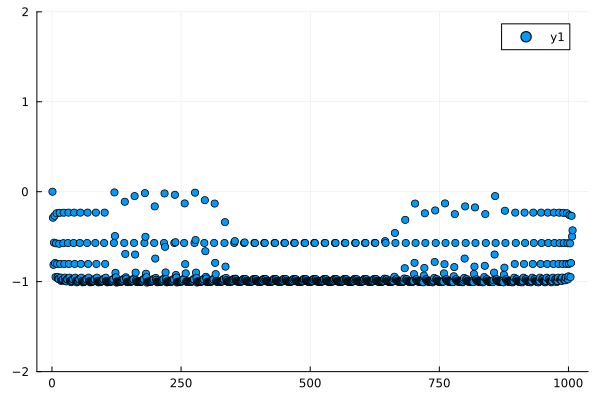

In [688]:
plt2 = scatter(1:N_PTB, local_pol_PTBSiteWiseList_PTB,ylims=(-2,2))
display(plt2)

In [689]:
Gap_PTB = 2*minimum(abs.(energy_eigenvalues_PTB))

8.881784197001252e-16

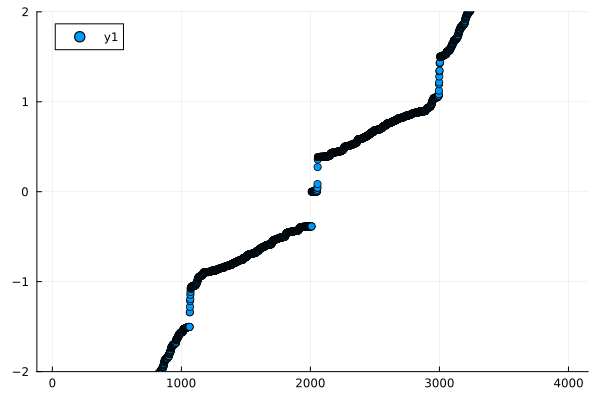

In [690]:
plt2 = scatter(1:NOrbitalsInside, energy_eigenvalues_PTB, ylims=(-2,2))
display(plt2)

In [691]:
function state_to_real_space_LDoS(v::Array{ComplexF64})
    n_sites = Int(size(v)[1]/4)
    prob_dist = zeros(n_sites)
    for ii = 1:n_sites
        prob_dist[ii] = abs(v[4*ii-3])^2 + abs(v[4*ii-2])^2 +  abs(v[4*ii-1])^2 +  abs(v[4*ii])^2
    end
    return prob_dist
end 

state_to_real_space_LDoS (generic function with 1 method)

## Plot of LDoS of topological states of PTB

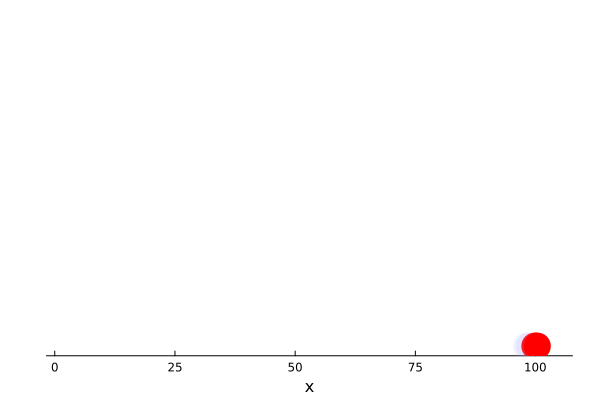

In [692]:
#boundary_state_nearest_zero = eigenstates_PTB[:,N_PTB];
probability_boundary_state = state_to_real_space_LDoS(eigenstates_PTB[:,2*N_PTB]) + state_to_real_space_LDoS(eigenstates_PTB[:,2*N_PTB+1]);

color_map = cgrad([RGB(1,1,1), RGB(0,0,1), RGB(1,0,0)])

# Calculate alphas based on y values
function alpha_function(p, pmax)
    if p < pmax/10
        return 0
    else
        return p/pmax
    end
end
alphas = alpha_function.(probability_boundary_state, maximum(probability_boundary_state))

#plt_PTB_BD_states = scatter(distance_along_projected_line, probability_boundary_state)
plt_PTB_BD_states = scatter(distance_along_projected_line, ones(N_PTB), 
                            zcolor=probability_boundary_state, legend=false, xlabel="x", colorbar_title="Value",
                            c=color_map, ms=15, seriesalpha=alphas, markerstrokewidth=0, grid=false,
                            yaxis=false)

display(plt_PTB_BD_states)

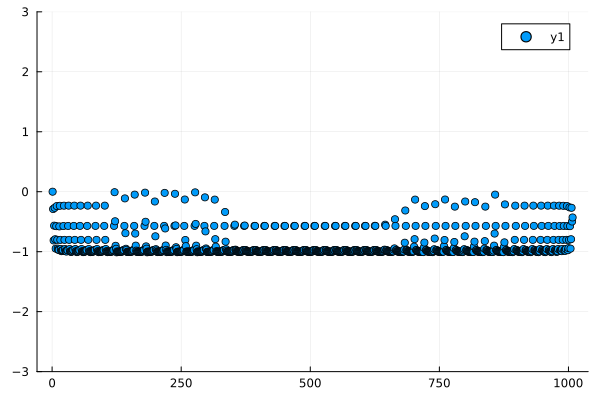

In [693]:
plt_PTB_local_marker_sitewise = scatter(1:N_PTB, local_pol_PTBSiteWiseList_PTB,ylims=(-3,3),yticks=range(-3,3,7))

### Now I isolate sites on the middle line, and plot their local Chern markers

### For each value of x, I find the site on the PTB closest to the middle line

#### Note that this works only if PTB is thick enough to have more than Lx points

In [694]:
### I generate an array which are the points closest to the middle line
middle_line_x_coordinates = 1:Lx;
middle_line_y_coordinates = round.(line_middle.(float(middle_line_x_coordinates)));

In [695]:
Indices_of_PTB_middle_points = zeros(Lx);
local_marker_PTB_list_middle_points = zeros(Lx);

for ii = 1:Lx
    for jj = 1:N_PTB
        if (XList_PTB[jj] == middle_line_x_coordinates[ii]) && (YList_PTB[jj] == middle_line_y_coordinates[ii])
            Indices_of_PTB_middle_points[ii] = PTB_index[jj];
            local_marker_PTB_list_middle_points[ii] = local_pol_PTBSiteWiseList_PTB[jj];
        end
    end
end


In [696]:
mode_chern = modes(round.(local_marker_PTB_list_middle_points))[1]

-1.0

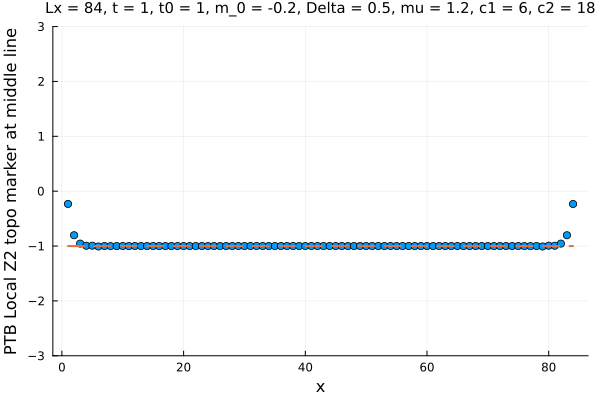

In [697]:
### We will plot the local Chern marker along the line y = Ly/2
plt_local_PTB = scatter(1:Lx, local_marker_PTB_list_middle_points, ylims=(-3,3), legend=:none,
                xlabel="x", ylabel="PTB Local Z2 topo marker at middle line", 
                title=string("Lx = ", string(Lx), ", t = ", string(t), ", t0 = ", string(t0), ", m_0 = ", string(m_0), ", Delta = ", string(Delta), ", mu = ", string(mu), ", c1 = ", string(c1), ", c2 = ", string(c2)), titlefontsize=10)
plt_local_PTB = plot!(1:Lx, mode_chern*ones(Lx), linestyle=:dash, thickness=2, linewidth=2)
display(plt_local_PTB)

In [698]:
function plot_anything_in_PTB_to_parent_lattice(v::Array{Float64}, Lx, Ly)
    local_density_on_lattice = fill(NaN, Lx*Ly)
    for ii = 1:length(v)
        local_density_on_lattice[Int(PTB_index[ii])] = v[ii]
    end
    density = zeros(Lx,Ly)

    local_density = copy(local_density_on_lattice)
	for a = 1:Lx
		for b = 1:Ly
			density[a,b] = local_density[a + (b-1)*Lx];
		end
	end

	
	xx = range(1, stop=Lx, length=Lx)
	yy = range(1, stop=Ly, length=Ly)

	xx = repeat(xx, 1, Ly)'
	yy = repeat(yy, 1, Lx)

	# point_size = 500 * vec(density')

plt = scatter(
    vec(xx), vec(yy),
    marker_z = vec(density'),
    color = cgrad([:green, :red, :blue], [-1, 0, 1]), # Custom gradient
    colorbar = true,
    legend = false,
    xlabel = "X",
    ylabel = "Y",
    yguidefontrotation = 270, # Rotates the Y label vertically
    title = "weak invariant",
    grid = false,
    markerstrokewidth = 0,
    aspect_ratio = 1,
    xlims = (0.5, Lx+0.5),             # Tight x-axis
    ylims = (0.5, Ly+0.5),              # Tight y-axis
    framestyle = :box,           # Box around plot
    xticks = [1, Lx],         # Set x-ticks
    yticks = [1, Ly],          # Set y-ticks
    tickfont = font(16, "Computer Modern"),
    guidefont = font(16, "Computer Modern"),
    titlefont = font(16, "Computer Modern"),
    size = (600, 600),
    markersize = 6
)


# plt = plot!(line_x,line_down_y,color="red",width=2, xlims=(0,Lx+1),ylims=(0,Ly+1),legend=:none,aspect_ratio=:equal,frame=:box, framestyle=:thick,xticks=[1,Lx/2,Lx],yticks=[1,Ly/2,Ly])
# plt = plot!(line_x,line_up_y,color="red",width=2)
# plt = plot!(line_x,line_middle.(line_x),color="blue",width=2)
# if exportdata==1
#     savefig(plt, string(folder_path, "localizer_index/", "localizer_spatial_dist.pdf"))
# end
return plt
end

plot_anything_in_PTB_to_parent_lattice (generic function with 1 method)

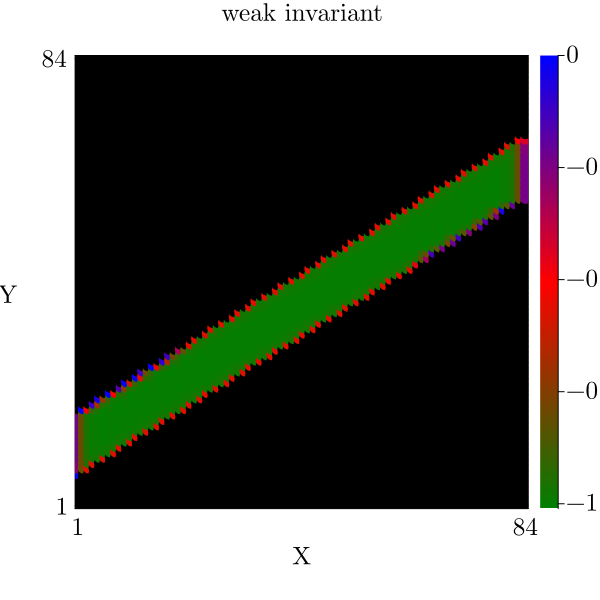

In [699]:
## Plot the local chern marker back to the original lattice coordinates
plot_anything_in_PTB_to_parent_lattice(local_pol_PTBSiteWiseList_PTB, Lx, Ly)

In [700]:
# Define the folder path (relative or absolute)
folder_path = "data/topo_super/"  # Change to your desired folder
# Ensure the folder exists
isdir(folder_path) || mkdir(folder_path)

filename = "t0=$(t0)_t=$(t)_m_0=$(m_0)_mu=$(mu)_Delta=$(Delta)_ky=$(ky)_x_periodic=$(x_periodic)_y_periodic=$(y_periodic)_L=$(L)_m=$(m)_c1=$(c1)_c2=$(c2).csv"

isdir(string(folder_path,"weak_invariant/")) || mkdir(string(folder_path,"weak_invariant/"))

if exportdata==1
    CSV.write(string(folder_path,"weak_invariant/",filename), (; local_marker_PTB_list_middle_points),writeheader=false)
end

"data/topo_super/weak_invariant/t0=1_t=1_m_0=-0.2_mu=1.2_Delta=0.5_ky=0_x_periodic=0_y_periodic=0_L=84_m=0.6180339887498949_c1=6_c2=18.csv"

In [701]:
### Also save local_pol_PTBSiteWiseList_PTB
if exportdata==1
    CSV.write(string(folder_path,"weak_invariant/","all_",filename), (; local_pol_PTBSiteWiseList_PTB),writeheader=false)
end

"data/topo_super/weak_invariant/all_t0=1_t=1_m_0=-0.2_mu=1.2_Delta=0.5_ky=0_x_periodic=0_y_periodic=0_L=84_m=0.6180339887498949_c1=6_c2=18.csv"

In [702]:
t_end=time();
println("time taken = ", t_end - t_start," seconds")

In [703]:
t_end - t_start

879.1279540061951